In [1]:
import numpy
import tensorboard as tensorboard
import seaborn as seaborn
from tensorflow.python.client import device_lib
import tensorflow as tf
config = tf.compat.v1.ConfigProto(gpu_options = 
                         tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.8)
# device_count = {'GPU': 1}
)
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)
import os
import pandas as pd
import shap
import random
import numpy as np
import seaborn as sns
import csv
import time
import lime
from lime import lime_image
import sys
from skimage.segmentation import slic
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
from matplotlib.image import imread
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import kr_helper_funcs as kr
print('tensorflow' + tf.__version__)
print('tensorboard' + tensorboard.__version__)
print('seaborn' + seaborn.__version__)
tf.config.list_physical_devices('GPU')
print(tf.test.is_built_with_cuda)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
tf.config.experimental.list_physical_devices('GPU')
device_lib.list_local_devices()
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

tensorflow2.2.0
tensorboard2.2.2
seaborn0.10.1
<function is_built_with_cuda at 0x000002781A4E2550>
Num GPUs Available:  1


In [2]:
data_dir="../../input/kaggle-flowers"
test_path= os.path.join(data_dir, 'test')

os.listdir(test_path)

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

In [3]:
image_shape =(250, 250, 3)
test_gen = ImageDataGenerator(rescale =1./255)
batch_size=32
test_image_gen= test_gen.flow_from_directory(test_path, target_size=image_shape[:2], 
                                               color_mode='rgb', batch_size=batch_size, 
                                               class_mode='categorical',  shuffle=False)
test_image_gen.class_indices

Found 750 images belonging to 5 classes.


{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}

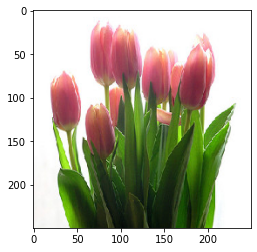

In [18]:
import shap
import numpy as np
X_test, _ = test_image_gen.next()
# background = X_test[np.random.choice(20, 10, replace=False)]
background = X_test[0:5]
# explain predictions of the model on three images
# e = shap.DeepExplainer(tf.keras.models.load_model('flowers'), background)

model =tf.keras.models.load_model('flowers-vgg')
# tulip_image_path = test_path + '/tulip/' + os.listdir(test_path + '/tulip/')[5]
tulip_image_path = test_path + '/tulip/' + os.listdir(test_path + '/tulip/')[5]
# plt.imshow(imread(dog_image))
img = image.load_img(tulip_image_path, target_size=(250, 250, 3))
# plt.imshow(imread(tulip_image_path))
img_orig = image.img_to_array(img)
standardized_image = test_gen.standardize(img_orig)
plt.imshow((standardized_image))

In [5]:
os.listdir(test_path + '/sunflower/')

['1008566138_6927679c8a.jpg',
 '1022552002_2b93faf9e7_n.jpg',
 '1022552036_67d33d5bd8_n.jpg',
 '1043442695_4556c4c13d_n.jpg',
 '1044296388_912143e1d4.jpg',
 '1064662314_c5a7891b9f_m.jpg',
 '1217254584_4b3028b93d.jpg',
 '1240624822_4111dde542.jpg',
 '1240625276_fb3bd0c7b1.jpg',
 '1240626292_52cd5d7fb1_m.jpg',
 '1244774242_25a20d99a9.jpg',
 '1267876087_a1b3c63dc9.jpg',
 '127192624_afa3d9cb84.jpg',
 '1297092593_e573c0a3d6.jpg',
 '1314584013_fe935fdeb1_n.jpg',
 '1379256773_bb2eb0d95b_n.jpg',
 '1419608016_707b887337_n.jpg',
 '145303599_2627e23815_n.jpg',
 '147804446_ef9244c8ce_m.jpg',
 '1484598527_579a272f53.jpg',
 '1485456230_58d8e45e88.jpg',
 '151898652_b5f1c70b98_n.jpg',
 '1596293240_2d5b53495a_m.jpg',
 '164668737_aeab0cb55e_n.jpg',
 '164670176_9f5b9c7965.jpg',
 '164670455_29d8e02bbd_n.jpg',
 '164671753_ab36d9cbb7_n.jpg',
 '164672339_f2b5b164f6.jpg',
 '1715303025_e7065327e2.jpg',
 '175638423_058c07afb9.jpg',
 '1788133737_b1133d1aa7.jpg',
 '184682095_46f8607278.jpg',
 '184682320_73ccf74710.jpg',
 '184682506_8a9b8c662d.jpg',
 '184682652_c927a49226_m.jpg',
 '184682920_97ae41ce60_m.jpg',
 '184683023_737fec5b18.jpg',
 '1880606744_23e3dc4f6b_n.jpg',
 '193874852_fb633d8d00_n.jpg',
 '193878348_43571127b9_n.jpg',
 '197011740_21825de2bf.jpg',
 '200011914_93f57ed68b.jpg',
 '200288046_0032f322ff_n.jpg',
 '200557977_bf24d9550b.jpg',
 '200557979_a16112aac1_n.jpg',
 '200557981_f800fa1af9.jpg',
 '200557983_10a88672fc.jpg',
 '201809908_0ef84bb351.jpg',
 '2067882323_8de6623ffd.jpg',
 '210076535_80951bc5d5.jpg',
 '215798352_184d8040d1.jpg',
 '215798354_429de28c2d.jpg',
 '215798357_3f4bfa27b7.jpg',
 '2307673262_e1e1aefd29.jpg',
 '2328600790_90e2942557_n.jpg',
 '235651658_a7b3e7cbdd.jpg',
 '2425164088_4a5d2cdf21_n.jpg',
 '244074259_47ce6d3ef9.jpg',
 '2442985637_8748180f69.jpg',
 '2443095419_17b920d155_m.jpg',
 '2443921986_d4582c123a.jpg',
 '24459548_27a783feda.jpg',
 '24459750_eb49f6e4cb_m.jpg',
 '253586685_ee5b5f5232.jpg',
 '2575272111_f04d79b9af_n.jpg',
 '2588234269_c4bfd0d8b9_n.jpg',
 '2588453601_66f2a03cca_n.jpg',
 '2598973480_07de93e91d_n.jpg',
 '2619000556_6634478e64_n.jpg',
 '26254755_1bfc494ef1_n.jpg',
 '265422922_bbbde781d2_m.jpg',
 '265450085_6e9f276e2e.jpg',
 '2678588376_6ca64a4a54_n.jpg',
 '2689228449_e0be72cf00_n.jpg',
 '2694860538_b95d60122c_m.jpg',
 '2697194548_ec8f8de97c_n.jpg',
 '2706304885_4916102704_n.jpg',
 '2706736074_b0fba20b3e.jpg',
 '2720698862_486d3ec079_m.jpg',
 '2721638730_34a9b7a78b.jpg',
 '2723995667_31f32294b4.jpg',
 '2729206569_9dd2b5a3ed.jpg',
 '2733109082_1351f6738a_n.jpg',
 '27465811_9477c9d044.jpg',
 '27466794_57e4fe5656.jpg',
 '274846229_990e976683_n.jpg',
 '274848710_5185cf33b1_n.jpg',
 '2759796022_55bd47bfa2_n.jpg',
 '2767658405_1e2043f44c_n.jpg',
 '2767688889_b176b0c3fb.jpg',
 '2803725948_5fd1f2fc99_n.jpg',
 '2807106374_f422b5f00c.jpg',
 '2816256710_a2d3616fae.jpg',
 '2816503473_580306e772.jpg',
 '2823659190_afdabee45c.jpg',
 '287233531_74d4605814_m.jpg',
 '2883115609_5a69357b5d_m.jpg',
 '2883115621_4837267ea1_m.jpg',
 '2894191705_a1d2d80c80.jpg',
 '2895404754_6d9f9416d7_n.jpg',
 '2927020075_54c9186797_n.jpg',
 '2940221732_3507f3e927_n.jpg',
 '2944298800_1984bd4f8a_m.jpg',
 '2949654221_909b0c86a1_n.jpg',
 '2950505226_529e013bf7_m.jpg',
 '2960610406_b61930727f_n.jpg',
 '2979133707_84aab35b5d.jpg',
 '2979297519_17a08b37f6_m.jpg',
 '2980154410_bffd7a3452_n.jpg',
 '2996573407_5e473b9359.jpg',
 '29972905_4cc537ff4b_n.jpg',
 '3001531316_efae24d37d_n.jpg',
 '3001533700_1c62fb8b4a_n.jpg',
 '3001536784_3bfd101b23_n.jpg',
 '3062794421_295f8c2c4e.jpg',
 '310380634_60e6c79989.jpg',
 '3146795631_d062f233c1.jpg',
 '3154932076_eff5c38231_n.jpg',
 '3154932290_4bf43bd34f_n.jpg',
 '3196753837_411b03682d_n.jpg',
 '3311874685_7b9ef10f7e_m.jpg',
 '3334350831_f8755a2095_n.jpg',
 '3466923719_b4b6df7f8b_n.jpg',
 '3514340206_efb8198a80_n.jpg',
 '35477171_13cb52115c_n.jpg',
 '3568114325_d6b1363497.jpg',
 '3568925290_faf7aec3a0.jpg',
 '3575811488_a31714472a.jpg',
 '3594967811_697184b026_n.jpg',
 '3596902268_049e33a2cb_n.jpg',
 '39271782_

In [19]:
# segment the image so we don't have to explain every pixel
segments_slic = slic(img, n_segments=50, compactness=30, sigma=3)

# define a function that depends on a binary mask representing if an image region is hidden
def mask_image(zs, segmentation, image, background=None):
    if background is None:
        background = image.mean((0,1))
    out = np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
    for i in range(zs.shape[0]):
        out[i,:,:,:] = image
        for j in range(zs.shape[1]):
            if zs[i,j] == 0:
                out[i][segmentation == j,:] = background
    return out
def f(z):
    return model.predict(mask_image(z, segments_slic, img_orig, 250))

skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.


In [22]:
# use Kernel SHAP to explain the network's predictions
explainer = shap.KernelExplainer(f, np.zeros((1,50)))
shap_values = explainer.shap_values(np.ones((1,50)) , nsamples=1000) # runs VGG16 1000 times

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!


In [8]:
list(test_image_gen.class_indices.keys())

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

In [23]:
# get the top predictions from the model
preds = model.predict(np.expand_dims(img_orig.copy(), axis=0))
top_preds = np.argsort(-preds)

In [24]:
 model.predict(np.expand_dims(img_orig.copy(), axis=0))

array([[4.4236265e-05, 1.2953770e-05, 1.0202373e-03, 3.3680807e-04,
        9.9858582e-01]], dtype=float32)

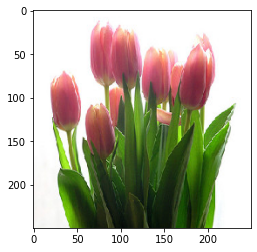

In [25]:
plt.imshow(img_orig.copy())

In [26]:
# make a color map
from matplotlib.colors import LinearSegmentedColormap
colors = []
for l in np.linspace(1,0,100):
    colors.append((245/255,39/255,87/255,l))
for l in np.linspace(0,1,100):
    colors.append((24/255,196/255,93/255,l))
cm = LinearSegmentedColormap.from_list("shap", colors)

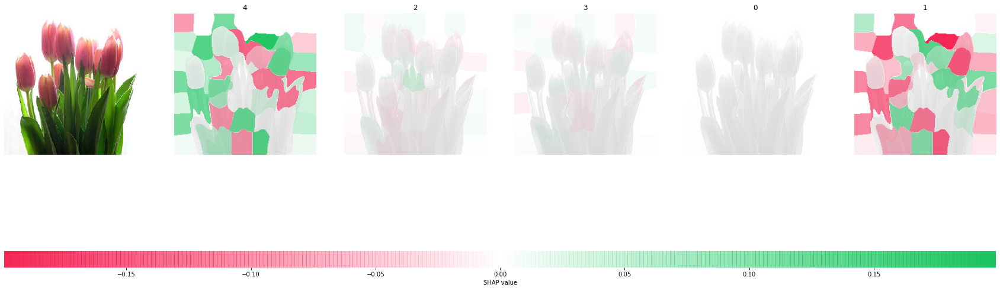

In [27]:
def fill_segmentation(values, segmentation):
    out = np.zeros(segmentation.shape)
    for i in range(len(values)):
        out[segmentation == i] = values[i]
    return out

# plot our explanations
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30,20))
inds = top_preds[0]
axes[0].imshow(img)
axes[0].axis('off')
max_val = np.max([np.max(np.abs(shap_values[i][:,:-1])) for i in range(len(shap_values))])
for i in range(5):
    m = fill_segmentation(shap_values[inds[i]][0], segments_slic)
    axes[i+1].set_title(str(inds[i]))
    axes[i+1].imshow(img.convert('LA'), alpha=0.15)
    im = axes[i+1].imshow(m, cmap=cm, vmin=-max_val, vmax=max_val)
    axes[i+1].axis('off')
cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
cb.outline.set_visible(False)
plt.show()

In [14]:
list(test_image_gen.class_indices.keys())

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.


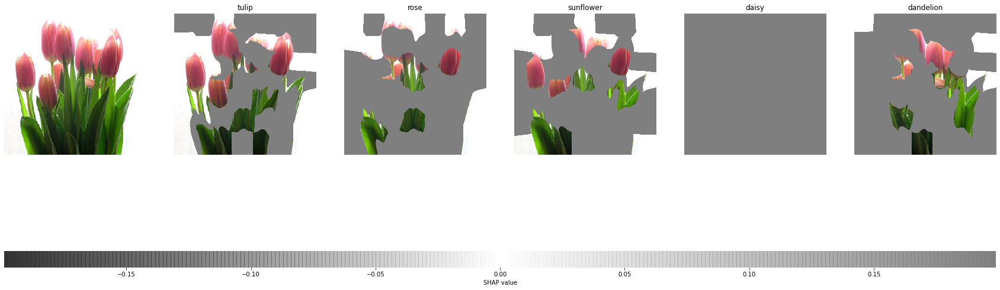

In [28]:
def extract_top_ten(shap_values, num_features=50):
    new_shap_values=[]
    for values in shap_values:
        shap_list = list(set([item for sublist in values for item in sublist]))
        shap_list.sort(reverse=True)
        shap_list = shap_list[:num_features]
        new_values = [numpy.asarray([a if a in shap_list else 0 for a in l]) for l in values] # filter out negative values and keep top 10
        new_shap_values.append(new_values)
    shap_values = numpy.asarray(new_shap_values)
    return shap_values
    
def show_cut_image(shap_values, img_orig):
# segment the image so we don't have to explain every pixel
    segments_slic = slic(img_orig, n_segments=50, compactness=30, sigma=3)

    # define a function that depends on a binary mask representing if an image region is hidden
    def mask_image(zs, segmentation, image, background=None):
        if background is None:
            background = image.mean((0,1))
        out = np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
        for i in range(zs.shape[0]):
            out[i,:,:,:] = image
            for j in range(zs.shape[1]):
                if zs[i,j] == 0:
                    out[i][segmentation == j,:] = background
        return out
    def f(z):
        for img in mask_image(z, segments_slic, img_orig, 250):
            plt.imshow(img)
            plt.show()
        print(model.predict(mask_image(z, segments_slic, img_orig, 250)))
        return model.predict((mask_image(z, segments_slic, img_orig, 250)))

    # # use Kernel SHAP to explain the network's predictions
#     explainer = shap.KernelExplainer(f, np.zeros((1,50)))
#     shap_values = explainer.shap_values(np.ones((1,50)), nsamples=5000) # runs model 1000 times

    # shap_values = extract_top_ten(shap_values, 500)

    # get the top predictions from the model
    preds = model.predict((np.expand_dims(img_orig.copy(), axis=0)))
    top_preds = np.argsort(-preds)

    # make a color map
    from matplotlib.colors import LinearSegmentedColormap
    colors = []
    for l in np.linspace(1,0,100):
        colors.append((0.2,0.2,0.2,l))
    for l in np.linspace(0,1,100):
        colors.append((0.5,0.5,0.5,l))
    cm = LinearSegmentedColormap.from_list("shap", colors)

    def fill_segmentation(values, segmentation):
        out = np.zeros(segmentation.shape)
        for i in range(len(values)):
            out[segmentation == i] = 0 if values[i]> 0 else 1
        return out

    # plot our explanations
    fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30,20))
    inds = top_preds[0]
    axes[0].imshow(img_orig)
    axes[0].axis('off')
    max_val = np.max([np.max(np.abs(shap_values[i][:,:-1])) for i in range(len(shap_values))])
    for i in range(5):
        m = fill_segmentation(shap_values[inds[i]][0], segments_slic)
        axes[i+1].set_title(str(list(test_image_gen.class_indices.keys())[inds[i]]))
        axes[i+1].imshow(img_orig)
        im = axes[i+1].imshow(m, cmap=cm, vmin=-max_val, vmax=max_val)
        plt.savefig('foo.png')
        axes[i+1].axis('off')
    cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
    cb.outline.set_visible(False)
    plt.show()
    
show_cut_image(shap_values, img_orig)

In [29]:
np.argsort(-preds)

array([[4, 2, 3, 0, 1]], dtype=int64)

In [39]:
import grad_cam as grad

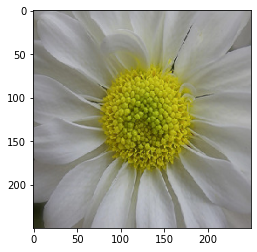

Explainer name: grad Image number: 1 num_features 1 batch 0 number 0 strategy top


skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.


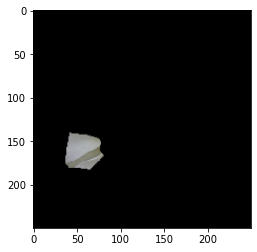

[0.46651304 0.13791066 0.35078615 0.01381952 0.03097062]
Original Class: 0 original confidence:0.8408424258232117 new class top:0 new confidence top: 0.4665130376815796 
Explainer name: grad Image number: 1 num_features 1 batch 0 number 0 strategy rest
Hitting cache, returning prev values


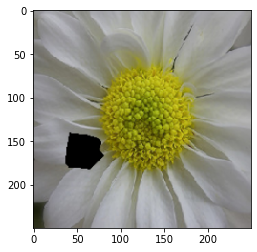

[0.76777583 0.01506363 0.00410786 0.2096646  0.00338811]
Original Class: 0 original confidence:0.8408424258232117 new class top:0 new confidence top: 0.76777583360672 
Explainer name: grad Image number: 1 num_features 2 batch 0 number 0 strategy top
Hitting cache, returning prev values


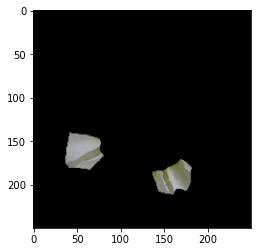

[0.3654199  0.02873649 0.53407973 0.00655275 0.06521108]
Original Class: 0 original confidence:0.8408424258232117 new class top:2 new confidence top: 0.3654198944568634 
Explainer name: grad Image number: 1 num_features 2 batch 0 number 0 strategy rest
Hitting cache, returning prev values


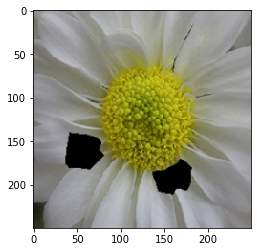

[0.6090455  0.01355148 0.00769583 0.36051676 0.00919053]
Original Class: 0 original confidence:0.8408424258232117 new class top:0 new confidence top: 0.6090455055236816 
Explainer name: grad Image number: 1 num_features 3 batch 0 number 0 strategy top
Hitting cache, returning prev values


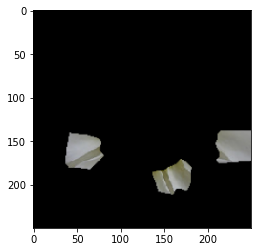

[0.43028536 0.01855109 0.47896814 0.00801232 0.06418312]
Original Class: 0 original confidence:0.8408424258232117 new class top:2 new confidence top: 0.43028536438941956 
Explainer name: grad Image number: 1 num_features 3 batch 0 number 0 strategy rest
Hitting cache, returning prev values


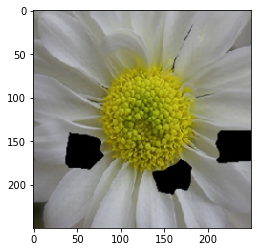

[0.5265905  0.01265218 0.00707275 0.4442816  0.0094029 ]
Original Class: 0 original confidence:0.8408424258232117 new class top:0 new confidence top: 0.5265905261039734 
Explainer name: grad Image number: 1 num_features 4 batch 0 number 0 strategy top
Hitting cache, returning prev values


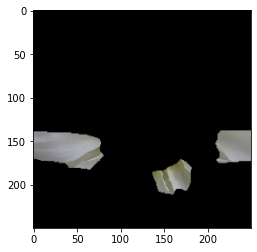

[0.64796627 0.02811774 0.19268218 0.00857864 0.12265518]
Original Class: 0 original confidence:0.8408424258232117 new class top:0 new confidence top: 0.6479662656784058 
Explainer name: grad Image number: 1 num_features 4 batch 0 number 0 strategy rest
Hitting cache, returning prev values


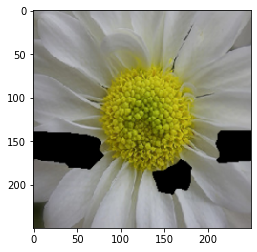

[0.5067046  0.01827876 0.00707075 0.4580008  0.00994511]
Original Class: 0 original confidence:0.8408424258232117 new class top:0 new confidence top: 0.5067046284675598 
Explainer name: grad Image number: 1 num_features 5 batch 0 number 0 strategy top
Hitting cache, returning prev values


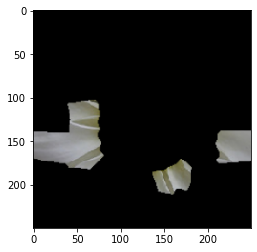

[0.16872783 0.01940619 0.47490448 0.04730342 0.28965816]
Original Class: 0 original confidence:0.8408424258232117 new class top:2 new confidence top: 0.1687278300523758 
Explainer name: grad Image number: 1 num_features 5 batch 0 number 0 strategy rest
Hitting cache, returning prev values


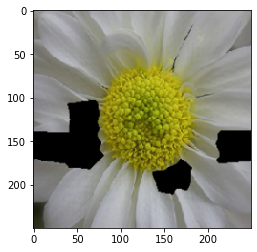

[0.30821335 0.00570464 0.01415167 0.6118816  0.06004873]
Original Class: 0 original confidence:0.8408424258232117 new class top:3 new confidence top: 0.30821335315704346 
Explainer name: grad Image number: 1 num_features 6 batch 0 number 0 strategy top
Hitting cache, returning prev values


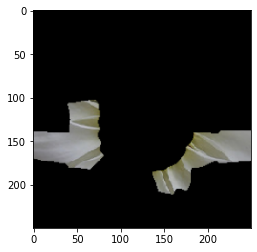

[0.08325753 0.02330723 0.5584063  0.15889122 0.17613775]
Original Class: 0 original confidence:0.8408424258232117 new class top:2 new confidence top: 0.0832575261592865 
Explainer name: grad Image number: 1 num_features 6 batch 0 number 0 strategy rest
Hitting cache, returning prev values


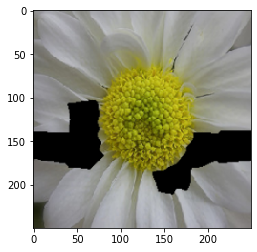

[0.28614601 0.01046128 0.01541653 0.5926762  0.09529991]
Original Class: 0 original confidence:0.8408424258232117 new class top:3 new confidence top: 0.28614601492881775 
Explainer name: grad Image number: 1 num_features 7 batch 0 number 0 strategy top
Hitting cache, returning prev values


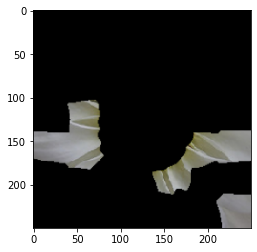

[0.08161966 0.01988454 0.5440086  0.16466883 0.18981838]
Original Class: 0 original confidence:0.8408424258232117 new class top:2 new confidence top: 0.08161965757608414 
Explainer name: grad Image number: 1 num_features 7 batch 0 number 0 strategy rest
Hitting cache, returning prev values


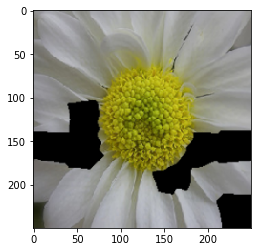

[0.30136597 0.01014203 0.01683139 0.57963985 0.09202074]
Original Class: 0 original confidence:0.8408424258232117 new class top:3 new confidence top: 0.3013659715652466 
Explainer name: grad Image number: 1 num_features 8 batch 0 number 0 strategy top
Hitting cache, returning prev values


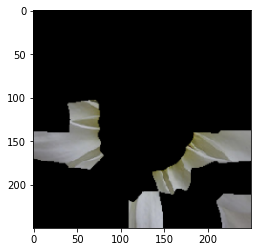

[0.06330575 0.00985528 0.36618844 0.24180211 0.3188485 ]
Original Class: 0 original confidence:0.8408424258232117 new class top:2 new confidence top: 0.06330575048923492 
Explainer name: grad Image number: 1 num_features 8 batch 0 number 0 strategy rest
Hitting cache, returning prev values


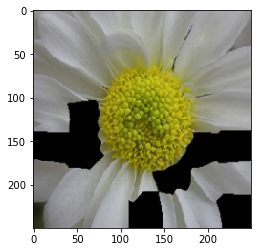

[0.19536889 0.00522841 0.0129217  0.67692655 0.10955443]
Original Class: 0 original confidence:0.8408424258232117 new class top:3 new confidence top: 0.19536888599395752 
Explainer name: grad Image number: 1 num_features 9 batch 0 number 0 strategy top
Hitting cache, returning prev values


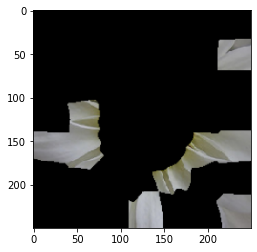

[0.05222976 0.00768865 0.36106616 0.30472478 0.2742906 ]
Original Class: 0 original confidence:0.8408424258232117 new class top:2 new confidence top: 0.05222976207733154 
Explainer name: grad Image number: 1 num_features 9 batch 0 number 0 strategy rest
Hitting cache, returning prev values


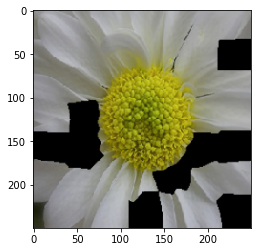

[0.16493502 0.00441657 0.01330943 0.68614566 0.13119338]
Original Class: 0 original confidence:0.8408424258232117 new class top:3 new confidence top: 0.16493502259254456 
Explainer name: grad Image number: 1 num_features 10 batch 0 number 0 strategy top
Hitting cache, returning prev values


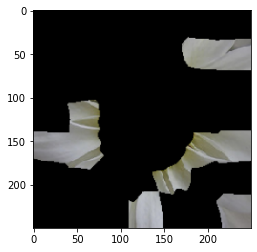

[0.05512964 0.0082295  0.20033398 0.12669763 0.6096092 ]
Original Class: 0 original confidence:0.8408424258232117 new class top:4 new confidence top: 0.05512964352965355 
Explainer name: grad Image number: 1 num_features 10 batch 0 number 0 strategy rest
Hitting cache, returning prev values


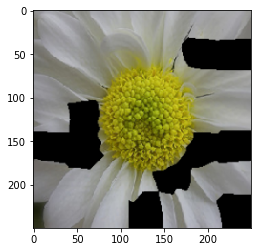

[0.0909657  0.00247318 0.00853713 0.58494604 0.31307793]
Original Class: 0 original confidence:0.8408424258232117 new class top:3 new confidence top: 0.09096570312976837 


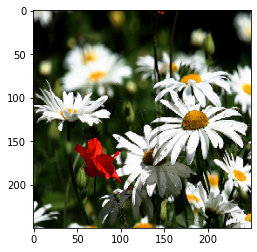

Explainer name: grad Image number: 2 num_features 1 batch 0 number 1 strategy top


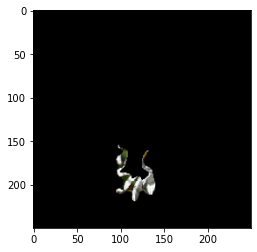

[0.04078496 0.865461   0.06675405 0.00087427 0.02612578]
Original Class: 0 original confidence:0.9960435628890991 new class top:1 new confidence top: 0.04078495502471924 
Explainer name: grad Image number: 2 num_features 1 batch 0 number 1 strategy rest
Hitting cache, returning prev values


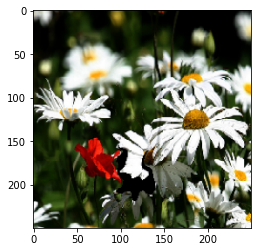

[9.9404812e-01 2.4651212e-04 4.0234914e-03 1.4948080e-03 1.8706336e-04]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.9940481185913086 
Explainer name: grad Image number: 2 num_features 2 batch 0 number 1 strategy top
Hitting cache, returning prev values


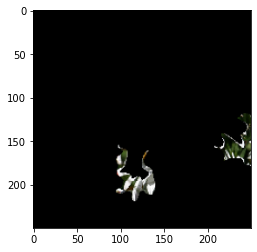

[0.04458494 0.84562314 0.0705627  0.00125305 0.03797622]
Original Class: 0 original confidence:0.9960435628890991 new class top:1 new confidence top: 0.044584937393665314 
Explainer name: grad Image number: 2 num_features 2 batch 0 number 1 strategy rest
Hitting cache, returning prev values


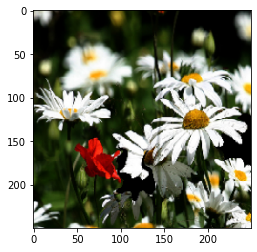

[9.9458355e-01 2.4335309e-04 3.4327284e-03 1.5263250e-03 2.1398265e-04]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.9945835471153259 
Explainer name: grad Image number: 2 num_features 3 batch 0 number 1 strategy top
Hitting cache, returning prev values


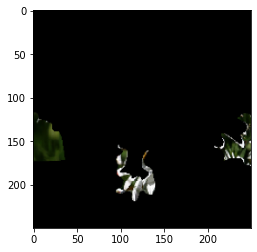

[0.11756989 0.54069185 0.14382963 0.00333162 0.19457698]
Original Class: 0 original confidence:0.9960435628890991 new class top:1 new confidence top: 0.11756988614797592 
Explainer name: grad Image number: 2 num_features 3 batch 0 number 1 strategy rest
Hitting cache, returning prev values


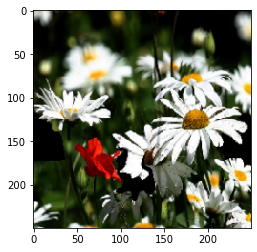

[9.9259079e-01 2.1702184e-04 5.1946938e-03 1.7599259e-03 2.3758457e-04]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.9925907850265503 
Explainer name: grad Image number: 2 num_features 4 batch 0 number 1 strategy top
Hitting cache, returning prev values


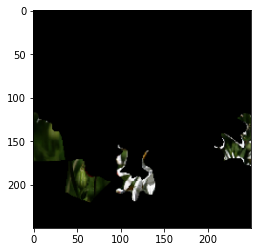

[0.06530285 0.450731   0.27661258 0.00480896 0.20254461]
Original Class: 0 original confidence:0.9960435628890991 new class top:1 new confidence top: 0.06530284881591797 
Explainer name: grad Image number: 2 num_features 4 batch 0 number 1 strategy rest
Hitting cache, returning prev values


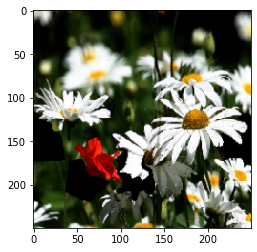

[9.9385732e-01 2.7310816e-04 4.1410858e-03 1.5304668e-03 1.9812048e-04]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.9938573241233826 
Explainer name: grad Image number: 2 num_features 5 batch 0 number 1 strategy top
Hitting cache, returning prev values


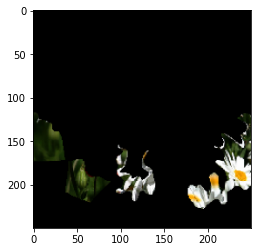

[0.13363922 0.21747269 0.34132805 0.00775727 0.2998027 ]
Original Class: 0 original confidence:0.9960435628890991 new class top:2 new confidence top: 0.13363921642303467 
Explainer name: grad Image number: 2 num_features 5 batch 0 number 1 strategy rest
Hitting cache, returning prev values


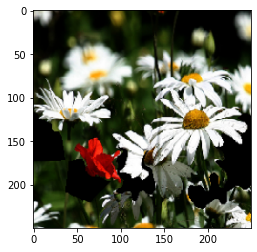

[9.9286711e-01 2.2209737e-04 5.0432622e-03 1.7045481e-03 1.6315620e-04]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.992867112159729 
Explainer name: grad Image number: 2 num_features 6 batch 0 number 1 strategy top
Hitting cache, returning prev values


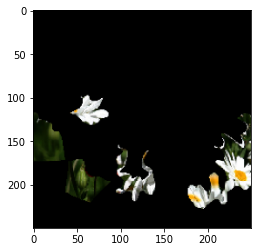

[0.18378623 0.02865163 0.52656734 0.00658429 0.25441048]
Original Class: 0 original confidence:0.9960435628890991 new class top:2 new confidence top: 0.18378622829914093 
Explainer name: grad Image number: 2 num_features 6 batch 0 number 1 strategy rest
Hitting cache, returning prev values


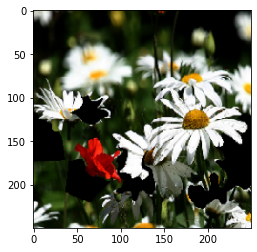

[9.84255314e-01 2.16659144e-04 1.32557405e-02 1.91384286e-03
 3.58464313e-04]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.984255313873291 
Explainer name: grad Image number: 2 num_features 7 batch 0 number 1 strategy top
Hitting cache, returning prev values


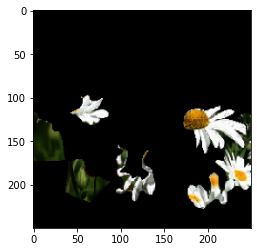

[0.7489211  0.00172252 0.21399853 0.01064845 0.02470941]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.7489210963249207 
Explainer name: grad Image number: 2 num_features 7 batch 0 number 1 strategy rest
Hitting cache, returning prev values


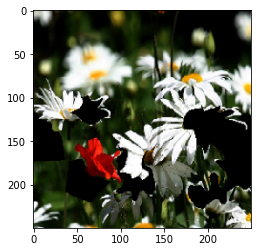

[0.96691895 0.00138638 0.01389106 0.00999351 0.00781005]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.9669189453125 
Explainer name: grad Image number: 2 num_features 8 batch 0 number 1 strategy top
Hitting cache, returning prev values


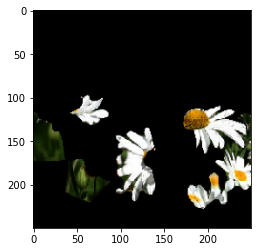

[8.3750027e-01 6.4319425e-04 1.3605647e-01 7.7094417e-03 1.8090704e-02]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.837500274181366 
Explainer name: grad Image number: 2 num_features 8 batch 0 number 1 strategy rest
Hitting cache, returning prev values


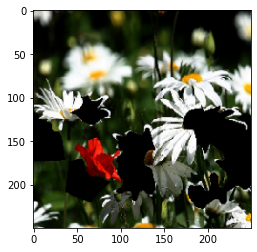

[0.91239667 0.00254371 0.04956843 0.01744473 0.0180465 ]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.9123966693878174 
Explainer name: grad Image number: 2 num_features 9 batch 0 number 1 strategy top
Hitting cache, returning prev values


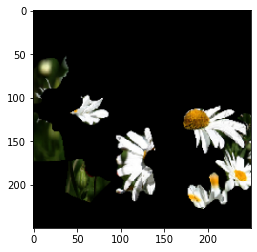

[0.82942665 0.00085392 0.14094669 0.00864565 0.02012719]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.829426646232605 
Explainer name: grad Image number: 2 num_features 9 batch 0 number 1 strategy rest
Hitting cache, returning prev values


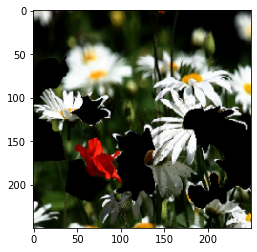

[0.90172976 0.00232473 0.05969212 0.01827392 0.01797952]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.9017297625541687 
Explainer name: grad Image number: 2 num_features 10 batch 0 number 1 strategy top
Hitting cache, returning prev values


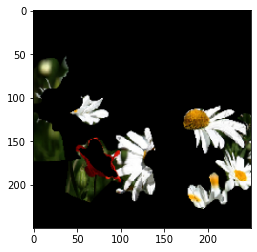

[5.1793355e-01 4.3269226e-04 4.6576169e-01 5.0051259e-03 1.0866923e-02]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.5179335474967957 
Explainer name: grad Image number: 2 num_features 10 batch 0 number 1 strategy rest
Hitting cache, returning prev values


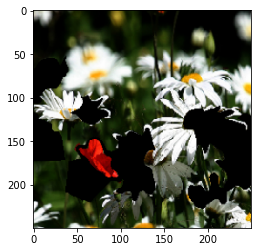

[0.9105288  0.00230731 0.06091342 0.01468644 0.01156402]
Original Class: 0 original confidence:0.9960435628890991 new class top:0 new confidence top: 0.9105287790298462 


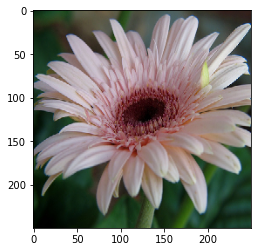

Explainer name: grad Image number: 3 num_features 1 batch 0 number 2 strategy top


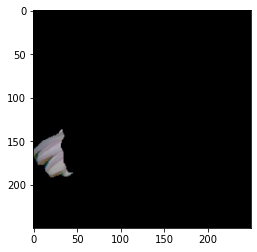

[0.2759313  0.49823853 0.1920533  0.01485481 0.01892207]
Original Class: 0 original confidence:0.9700012803077698 new class top:1 new confidence top: 0.27593129873275757 
Explainer name: grad Image number: 3 num_features 1 batch 0 number 2 strategy rest
Hitting cache, returning prev values


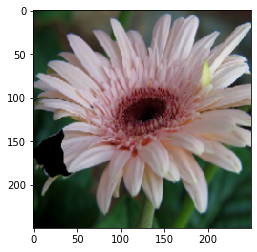

[0.9793504  0.00688279 0.00601223 0.00461913 0.00313543]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9793503880500793 
Explainer name: grad Image number: 3 num_features 2 batch 0 number 2 strategy top
Hitting cache, returning prev values


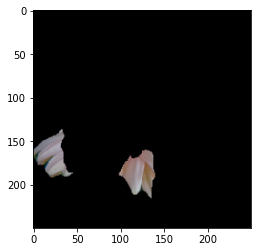

[0.36848798 0.01354052 0.53154206 0.01831041 0.06811899]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.36848798394203186 
Explainer name: grad Image number: 3 num_features 2 batch 0 number 2 strategy rest
Hitting cache, returning prev values


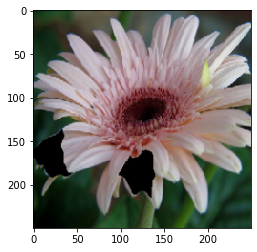

[0.9775114  0.00779113 0.00389081 0.00678965 0.00401708]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9775114059448242 
Explainer name: grad Image number: 3 num_features 3 batch 0 number 2 strategy top
Hitting cache, returning prev values


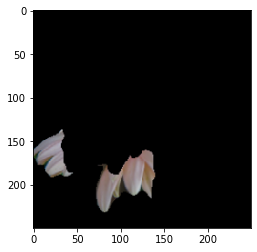

[0.28156316 0.00953824 0.38677135 0.01296556 0.30916166]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.2815631628036499 
Explainer name: grad Image number: 3 num_features 3 batch 0 number 2 strategy rest
Hitting cache, returning prev values


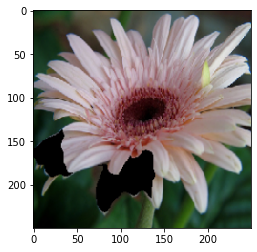

[0.9766807  0.01138203 0.00445904 0.00461856 0.00285961]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9766806960105896 
Explainer name: grad Image number: 3 num_features 4 batch 0 number 2 strategy top
Hitting cache, returning prev values


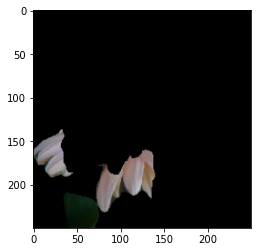

[0.2934709  0.00877463 0.3861822  0.01728023 0.294292  ]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.2934708893299103 
Explainer name: grad Image number: 3 num_features 4 batch 0 number 2 strategy rest
Hitting cache, returning prev values


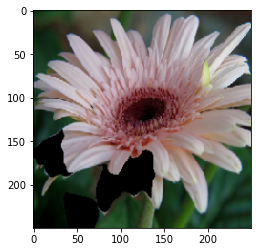

[0.9741745  0.01242004 0.0048573  0.0053256  0.00322249]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9741744995117188 
Explainer name: grad Image number: 3 num_features 5 batch 0 number 2 strategy top
Hitting cache, returning prev values


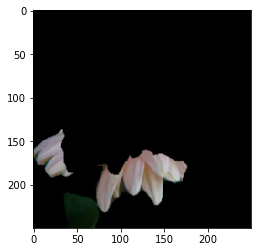

[0.39778763 0.00627902 0.42004013 0.02484374 0.1510495 ]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.3977876305580139 
Explainer name: grad Image number: 3 num_features 5 batch 0 number 2 strategy rest
Hitting cache, returning prev values


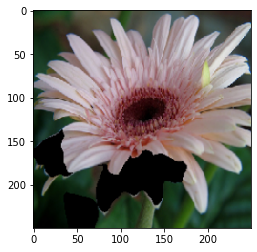

[0.9537938  0.01733029 0.01095305 0.01222481 0.00569801]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9537938237190247 
Explainer name: grad Image number: 3 num_features 6 batch 0 number 2 strategy top
Hitting cache, returning prev values


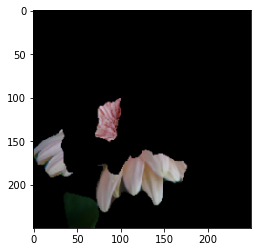

[0.09726788 0.00243584 0.6315191  0.01550998 0.2532672 ]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.09726788103580475 
Explainer name: grad Image number: 3 num_features 6 batch 0 number 2 strategy rest
Hitting cache, returning prev values


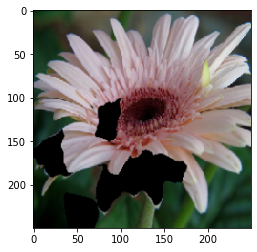

[0.9703186  0.00190183 0.00788802 0.0169727  0.00291879]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.970318615436554 
Explainer name: grad Image number: 3 num_features 7 batch 0 number 2 strategy top
Hitting cache, returning prev values


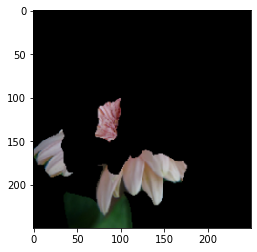

[0.09888075 0.00222779 0.67823243 0.01555957 0.20509948]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.09888074547052383 
Explainer name: grad Image number: 3 num_features 7 batch 0 number 2 strategy rest
Hitting cache, returning prev values


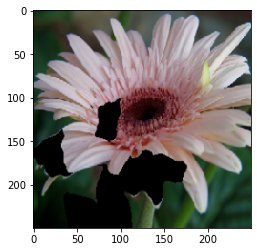

[0.96966267 0.0017084  0.00805978 0.01763744 0.00293175]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9696626663208008 
Explainer name: grad Image number: 3 num_features 8 batch 0 number 2 strategy top
Hitting cache, returning prev values


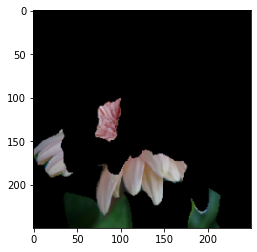

[0.08425016 0.00165275 0.7236961  0.0137575  0.17664345]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.08425015956163406 
Explainer name: grad Image number: 3 num_features 8 batch 0 number 2 strategy rest
Hitting cache, returning prev values


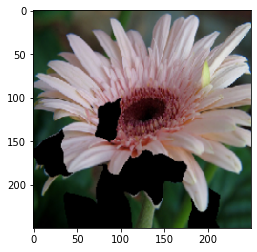

[0.9677219  0.00205109 0.01082284 0.01584607 0.00355814]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9677218794822693 
Explainer name: grad Image number: 3 num_features 9 batch 0 number 2 strategy top
Hitting cache, returning prev values


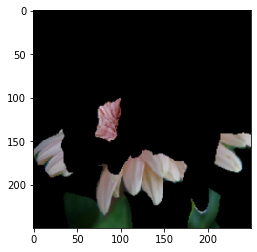

[0.05296913 0.00136884 0.5775184  0.01277819 0.3553654 ]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.052969131618738174 
Explainer name: grad Image number: 3 num_features 9 batch 0 number 2 strategy rest
Hitting cache, returning prev values


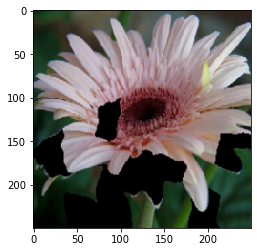

[0.93599343 0.00300639 0.02519837 0.03027417 0.0055276 ]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9359934329986572 
Explainer name: grad Image number: 3 num_features 10 batch 0 number 2 strategy top
Hitting cache, returning prev values


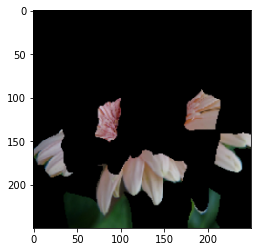

[0.06462737 0.00156993 0.67459804 0.02112366 0.238081  ]
Original Class: 0 original confidence:0.9700012803077698 new class top:2 new confidence top: 0.06462737172842026 
Explainer name: grad Image number: 3 num_features 10 batch 0 number 2 strategy rest
Hitting cache, returning prev values


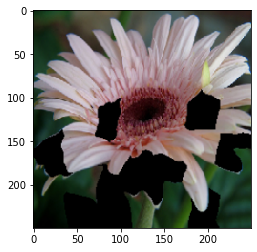

[9.6630681e-01 8.4365759e-04 6.9758617e-03 2.3633899e-02 2.2398119e-03]
Original Class: 0 original confidence:0.9700012803077698 new class top:0 new confidence top: 0.9663068056106567 


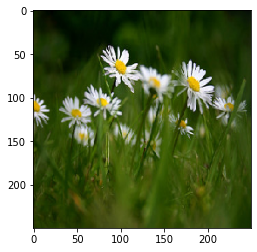

Explainer name: grad Image number: 4 num_features 1 batch 0 number 3 strategy top


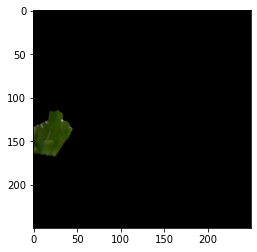

[0.0833771  0.7476975  0.12646647 0.02065955 0.02179944]
Original Class: 0 original confidence:0.9990460276603699 new class top:1 new confidence top: 0.08337710052728653 
Explainer name: grad Image number: 4 num_features 1 batch 0 number 3 strategy rest
Hitting cache, returning prev values


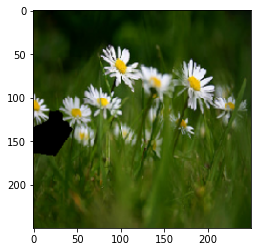

[9.9863297e-01 5.9197573e-05 3.6184407e-05 1.1494572e-03 1.2231679e-04]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.9986329674720764 
Explainer name: grad Image number: 4 num_features 2 batch 0 number 3 strategy top
Hitting cache, returning prev values


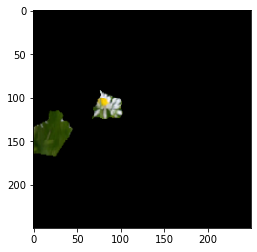

[0.3136456  0.11459173 0.32639986 0.08857961 0.15678325]
Original Class: 0 original confidence:0.9990460276603699 new class top:2 new confidence top: 0.313645601272583 
Explainer name: grad Image number: 4 num_features 2 batch 0 number 3 strategy rest
Hitting cache, returning prev values


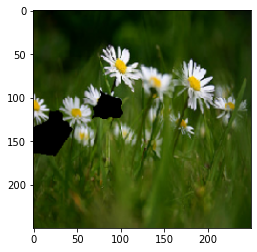

[9.9625278e-01 7.8352190e-05 1.4357535e-04 3.1506342e-03 3.7452905e-04]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.9962527751922607 
Explainer name: grad Image number: 4 num_features 3 batch 0 number 3 strategy top
Hitting cache, returning prev values


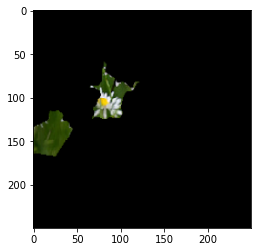

[0.10790737 0.03603978 0.7408456  0.02057009 0.09463724]
Original Class: 0 original confidence:0.9990460276603699 new class top:2 new confidence top: 0.10790736973285675 
Explainer name: grad Image number: 4 num_features 3 batch 0 number 3 strategy rest
Hitting cache, returning prev values


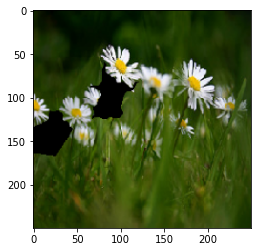

[9.9343866e-01 9.2749695e-05 4.3009530e-04 5.1361369e-03 9.0240320e-04]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.9934386610984802 
Explainer name: grad Image number: 4 num_features 4 batch 0 number 3 strategy top
Hitting cache, returning prev values


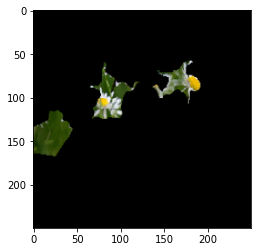

[0.00891014 0.00599488 0.36228573 0.00390262 0.6189066 ]
Original Class: 0 original confidence:0.9990460276603699 new class top:4 new confidence top: 0.008910141885280609 
Explainer name: grad Image number: 4 num_features 4 batch 0 number 3 strategy rest
Hitting cache, returning prev values


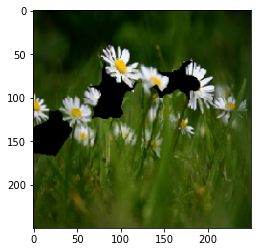

[9.9188995e-01 1.5654357e-04 8.1902510e-04 5.7588397e-03 1.3756810e-03]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.9918899536132812 
Explainer name: grad Image number: 4 num_features 5 batch 0 number 3 strategy top
Hitting cache, returning prev values


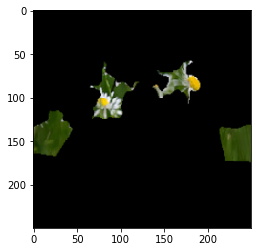

[0.0110137  0.00406031 0.34777367 0.00353888 0.63361347]
Original Class: 0 original confidence:0.9990460276603699 new class top:4 new confidence top: 0.011013696901500225 
Explainer name: grad Image number: 4 num_features 5 batch 0 number 3 strategy rest
Hitting cache, returning prev values


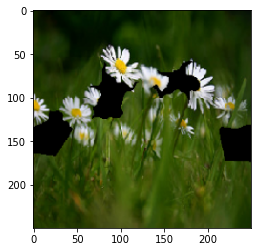

[9.9052936e-01 9.0504145e-05 8.6424057e-04 6.3701463e-03 2.1457500e-03]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.9905293583869934 
Explainer name: grad Image number: 4 num_features 6 batch 0 number 3 strategy top
Hitting cache, returning prev values


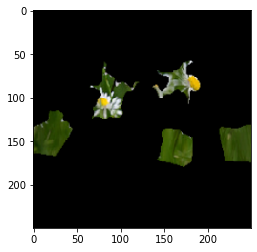

[0.01041551 0.00193646 0.26483685 0.00901457 0.7137966 ]
Original Class: 0 original confidence:0.9990460276603699 new class top:4 new confidence top: 0.010415509343147278 
Explainer name: grad Image number: 4 num_features 6 batch 0 number 3 strategy rest
Hitting cache, returning prev values


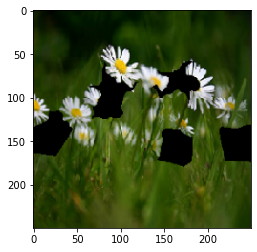

[9.7164041e-01 1.4440691e-04 1.7909503e-03 1.8799242e-02 7.6250304e-03]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.971640408039093 
Explainer name: grad Image number: 4 num_features 7 batch 0 number 3 strategy top
Hitting cache, returning prev values


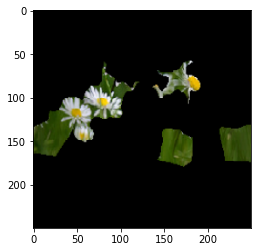

[0.04587588 0.00100596 0.47603187 0.06615347 0.41093284]
Original Class: 0 original confidence:0.9990460276603699 new class top:2 new confidence top: 0.04587588086724281 
Explainer name: grad Image number: 4 num_features 7 batch 0 number 3 strategy rest
Hitting cache, returning prev values


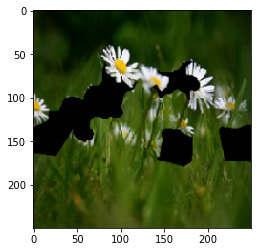

[9.1198939e-01 4.3819260e-04 4.8010135e-03 3.6386974e-02 4.6384368e-02]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.9119893908500671 
Explainer name: grad Image number: 4 num_features 8 batch 0 number 3 strategy top
Hitting cache, returning prev values


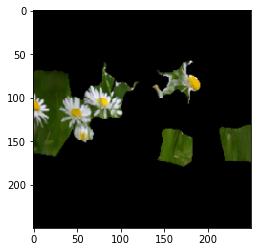

[0.12098181 0.00197036 0.1719748  0.11618797 0.58888507]
Original Class: 0 original confidence:0.9990460276603699 new class top:4 new confidence top: 0.12098181247711182 
Explainer name: grad Image number: 4 num_features 8 batch 0 number 3 strategy rest
Hitting cache, returning prev values


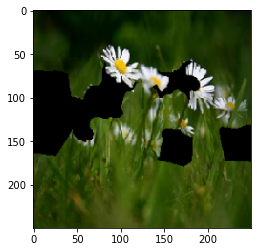

[9.0429318e-01 7.2088110e-04 4.4119516e-03 4.4574756e-02 4.5999337e-02]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.9042931795120239 
Explainer name: grad Image number: 4 num_features 9 batch 0 number 3 strategy top
Hitting cache, returning prev values


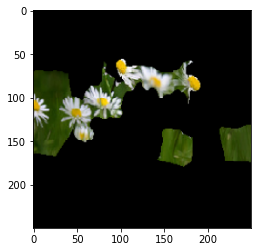

[0.2940214  0.0025902  0.10368555 0.17201477 0.42768806]
Original Class: 0 original confidence:0.9990460276603699 new class top:4 new confidence top: 0.2940213978290558 
Explainer name: grad Image number: 4 num_features 9 batch 0 number 3 strategy rest
Hitting cache, returning prev values


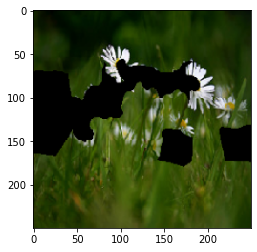

[0.21073803 0.00212042 0.00752491 0.03317286 0.74644375]
Original Class: 0 original confidence:0.9990460276603699 new class top:4 new confidence top: 0.21073803305625916 
Explainer name: grad Image number: 4 num_features 10 batch 0 number 3 strategy top
Hitting cache, returning prev values


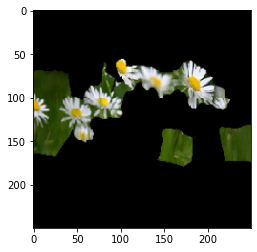

[0.3840756  0.00235504 0.15101974 0.18947901 0.27307057]
Original Class: 0 original confidence:0.9990460276603699 new class top:0 new confidence top: 0.3840756118297577 
Explainer name: grad Image number: 4 num_features 10 batch 0 number 3 strategy rest
Hitting cache, returning prev values


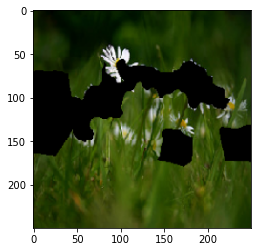

[0.01295097 0.00227985 0.05191256 0.01833835 0.91451824]
Original Class: 0 original confidence:0.9990460276603699 new class top:4 new confidence top: 0.012950966134667397 


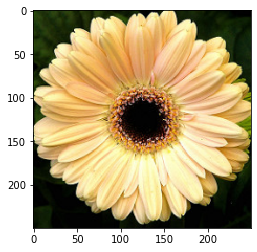

Explainer name: grad Image number: 5 num_features 1 batch 0 number 4 strategy top


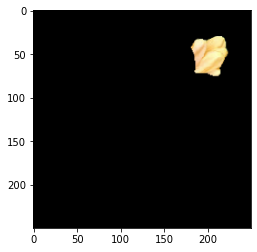

[0.11857188 0.48636588 0.35517216 0.02236676 0.01752337]
Original Class: 0 original confidence:0.9684265851974487 new class top:1 new confidence top: 0.11857187747955322 
Explainer name: grad Image number: 5 num_features 1 batch 0 number 4 strategy rest
Hitting cache, returning prev values


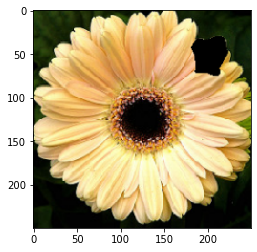

[0.9548841  0.00468463 0.00774959 0.02636709 0.00631463]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.9548841118812561 
Explainer name: grad Image number: 5 num_features 2 batch 0 number 4 strategy top
Hitting cache, returning prev values


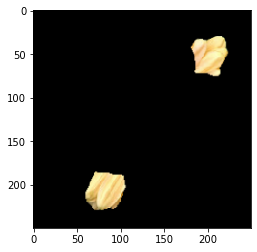

[0.19387643 0.02801781 0.73301584 0.00970273 0.03538718]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.19387643039226532 
Explainer name: grad Image number: 5 num_features 2 batch 0 number 4 strategy rest
Hitting cache, returning prev values


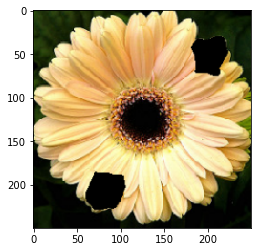

[0.9477669  0.00567801 0.01175085 0.02897398 0.00583021]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.947766900062561 
Explainer name: grad Image number: 5 num_features 3 batch 0 number 4 strategy top
Hitting cache, returning prev values


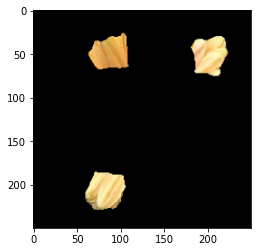

[0.06234538 0.01030433 0.87839204 0.00583286 0.04312531]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.06234537810087204 
Explainer name: grad Image number: 5 num_features 3 batch 0 number 4 strategy rest
Hitting cache, returning prev values


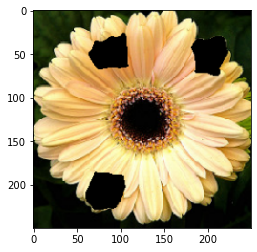

[0.9192298  0.00408363 0.01917483 0.04399831 0.0135134 ]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.9192298054695129 
Explainer name: grad Image number: 5 num_features 4 batch 0 number 4 strategy top
Hitting cache, returning prev values


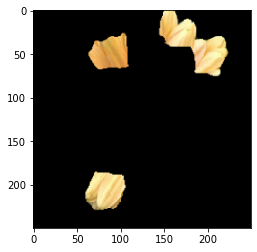

[0.06371772 0.00627251 0.86671877 0.00670603 0.05658498]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.06371772289276123 
Explainer name: grad Image number: 5 num_features 4 batch 0 number 4 strategy rest
Hitting cache, returning prev values


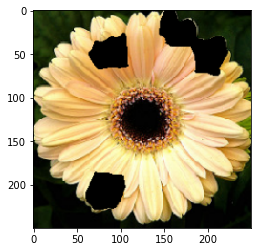

[0.9135875  0.00503676 0.02297601 0.04129441 0.01710537]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.9135875105857849 
Explainer name: grad Image number: 5 num_features 5 batch 0 number 4 strategy top
Hitting cache, returning prev values


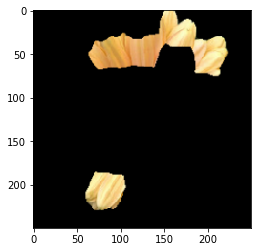

[0.07599408 0.00854802 0.85127556 0.01559257 0.04858971]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.0759940817952156 
Explainer name: grad Image number: 5 num_features 5 batch 0 number 4 strategy rest
Hitting cache, returning prev values


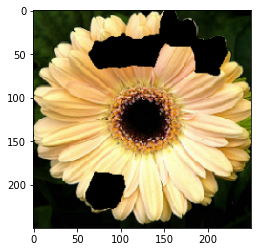

[0.9212573  0.00395539 0.01270092 0.04660745 0.01547888]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.9212573170661926 
Explainer name: grad Image number: 5 num_features 6 batch 0 number 4 strategy top
Hitting cache, returning prev values


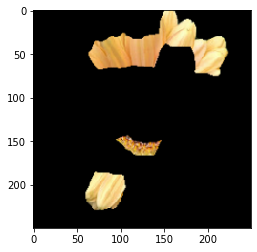

[0.04091661 0.01305443 0.83478016 0.02472566 0.08652315]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.04091661050915718 
Explainer name: grad Image number: 5 num_features 6 batch 0 number 4 strategy rest
Hitting cache, returning prev values


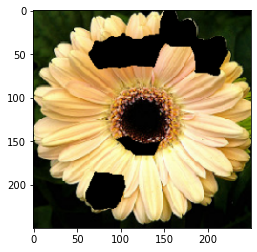

[0.87320316 0.0024379  0.01236659 0.10084186 0.01115041]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.8732031583786011 
Explainer name: grad Image number: 5 num_features 7 batch 0 number 4 strategy top
Hitting cache, returning prev values


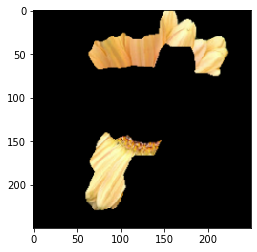

[0.03296159 0.02308588 0.8026413  0.05418866 0.08712269]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.032961588352918625 
Explainer name: grad Image number: 5 num_features 7 batch 0 number 4 strategy rest
Hitting cache, returning prev values


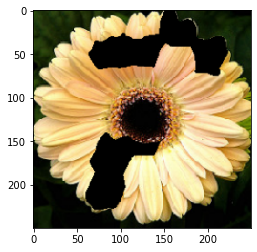

[0.87478673 0.00372232 0.04412612 0.06044399 0.01692085]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.8747867345809937 
Explainer name: grad Image number: 5 num_features 8 batch 0 number 4 strategy top
Hitting cache, returning prev values


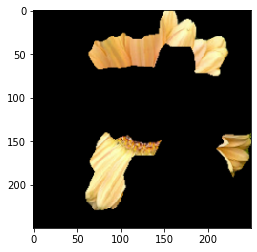

[0.02759464 0.0133772  0.81034    0.05472944 0.09395873]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.027594635263085365 
Explainer name: grad Image number: 5 num_features 8 batch 0 number 4 strategy rest
Hitting cache, returning prev values


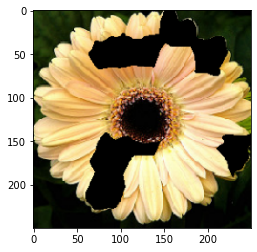

[0.83455473 0.00472448 0.06336796 0.08012031 0.01723246]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.8345547318458557 
Explainer name: grad Image number: 5 num_features 9 batch 0 number 4 strategy top
Hitting cache, returning prev values


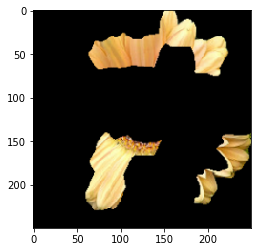

[0.03091072 0.01406192 0.79884094 0.03459252 0.12159386]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.030910715460777283 
Explainer name: grad Image number: 5 num_features 9 batch 0 number 4 strategy rest
Hitting cache, returning prev values


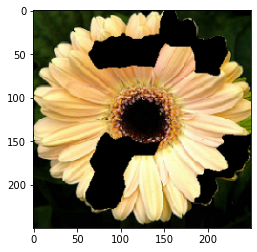

[0.81370306 0.0054778  0.07630614 0.08518126 0.01933174]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.8137030601501465 
Explainer name: grad Image number: 5 num_features 10 batch 0 number 4 strategy top
Hitting cache, returning prev values


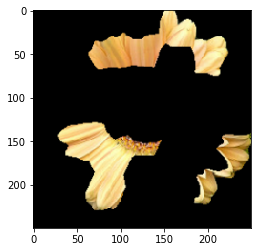

[0.09685682 0.01580745 0.41256648 0.11417898 0.36059025]
Original Class: 0 original confidence:0.9684265851974487 new class top:2 new confidence top: 0.09685681760311127 
Explainer name: grad Image number: 5 num_features 10 batch 0 number 4 strategy rest
Hitting cache, returning prev values


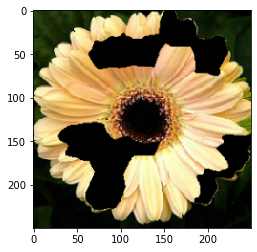

[0.76282775 0.00409612 0.05574565 0.12674317 0.05058719]
Original Class: 0 original confidence:0.9684265851974487 new class top:0 new confidence top: 0.7628277540206909 


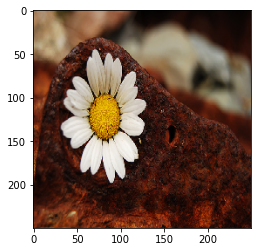

Explainer name: grad Image number: 6 num_features 1 batch 0 number 5 strategy top


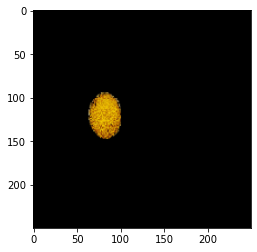

[0.49019304 0.48908693 0.00808711 0.00913033 0.00350263]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.49019303917884827 
Explainer name: grad Image number: 6 num_features 1 batch 0 number 5 strategy rest
Hitting cache, returning prev values


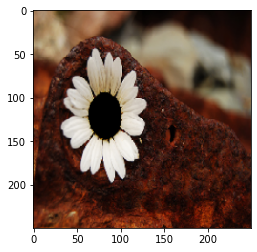

[0.89878726 0.02640905 0.00294341 0.04262057 0.02923976]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.898787260055542 
Explainer name: grad Image number: 6 num_features 2 batch 0 number 5 strategy top
Hitting cache, returning prev values


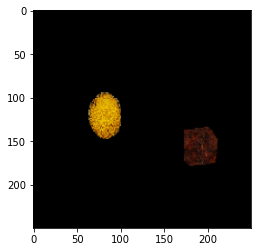

[0.72108626 0.23714261 0.01626236 0.01499627 0.01051238]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.7210862636566162 
Explainer name: grad Image number: 6 num_features 2 batch 0 number 5 strategy rest
Hitting cache, returning prev values


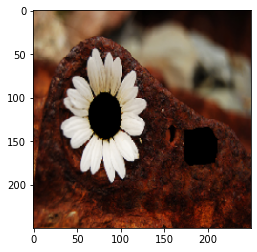

[0.90035826 0.03371419 0.00438435 0.03380564 0.02773757]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.900358259677887 
Explainer name: grad Image number: 6 num_features 3 batch 0 number 5 strategy top
Hitting cache, returning prev values


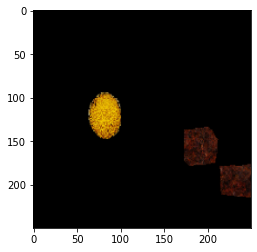

[0.74736124 0.20887817 0.01652416 0.01754393 0.00969257]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.7473612427711487 
Explainer name: grad Image number: 6 num_features 3 batch 0 number 5 strategy rest
Hitting cache, returning prev values


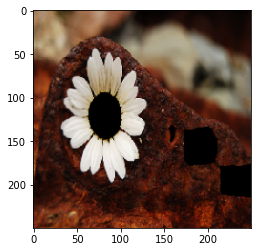

[0.91858417 0.02367817 0.004556   0.03246658 0.02071505]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.9185841679573059 
Explainer name: grad Image number: 6 num_features 4 batch 0 number 5 strategy top
Hitting cache, returning prev values


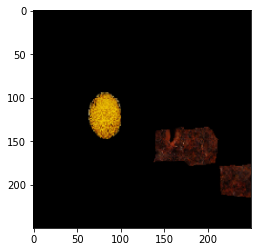

[0.69735867 0.233456   0.01710728 0.03962621 0.01245186]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.6973586678504944 
Explainer name: grad Image number: 6 num_features 4 batch 0 number 5 strategy rest
Hitting cache, returning prev values


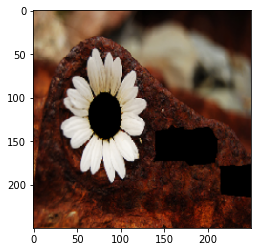

[0.931824   0.01682434 0.00443911 0.03224868 0.01466388]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.9318240284919739 
Explainer name: grad Image number: 6 num_features 5 batch 0 number 5 strategy top
Hitting cache, returning prev values


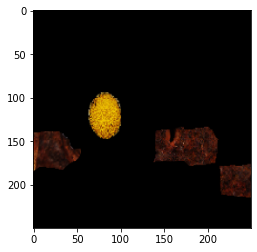

[0.65320605 0.1760879  0.04723858 0.10006408 0.0234034 ]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.6532060503959656 
Explainer name: grad Image number: 6 num_features 5 batch 0 number 5 strategy rest
Hitting cache, returning prev values


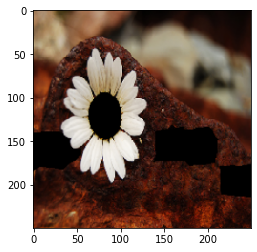

[0.9159214  0.01618885 0.004973   0.04436452 0.01855228]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.9159213900566101 
Explainer name: grad Image number: 6 num_features 6 batch 0 number 5 strategy top
Hitting cache, returning prev values


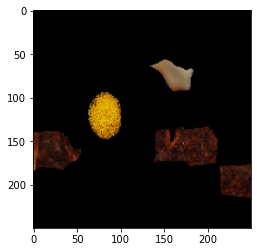

[0.56575096 0.14171323 0.09177256 0.08640492 0.11435822]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.5657509565353394 
Explainer name: grad Image number: 6 num_features 6 batch 0 number 5 strategy rest
Hitting cache, returning prev values


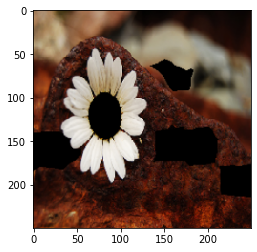

[0.88786846 0.00872478 0.01271999 0.05262281 0.03806389]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.8878684639930725 
Explainer name: grad Image number: 6 num_features 7 batch 0 number 5 strategy top
Hitting cache, returning prev values


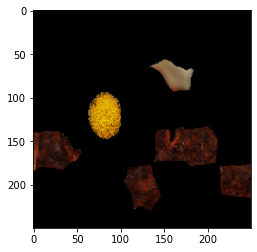

[0.43578076 0.07587057 0.13946626 0.13767797 0.21120445]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.43578076362609863 
Explainer name: grad Image number: 6 num_features 7 batch 0 number 5 strategy rest
Hitting cache, returning prev values


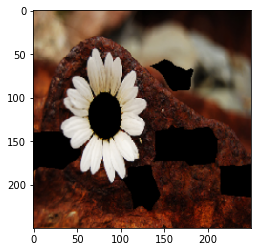

[0.88181293 0.00780756 0.01842432 0.06277636 0.02917878]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.8818129301071167 
Explainer name: grad Image number: 6 num_features 8 batch 0 number 5 strategy top
Hitting cache, returning prev values


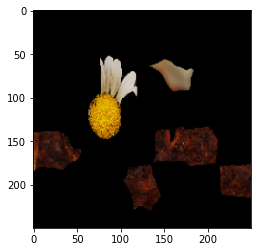

[0.648592   0.00988092 0.0460894  0.1259216  0.16951604]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.6485919952392578 
Explainer name: grad Image number: 6 num_features 8 batch 0 number 5 strategy rest
Hitting cache, returning prev values


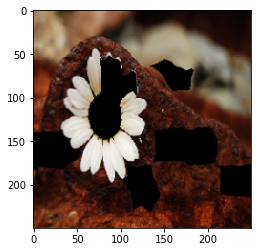

[0.45440644 0.01723716 0.3738805  0.08095805 0.07351778]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.4544064402580261 
Explainer name: grad Image number: 6 num_features 9 batch 0 number 5 strategy top
Hitting cache, returning prev values


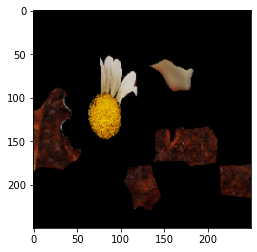

[0.56961524 0.00715969 0.06253773 0.09443122 0.26625612]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.5696152448654175 
Explainer name: grad Image number: 6 num_features 9 batch 0 number 5 strategy rest
Hitting cache, returning prev values


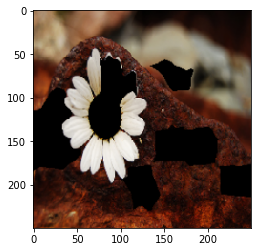

[0.38889122 0.01545144 0.43902937 0.09634769 0.06028024]
Original Class: 0 original confidence:0.977972149848938 new class top:2 new confidence top: 0.38889122009277344 
Explainer name: grad Image number: 6 num_features 10 batch 0 number 5 strategy top
Hitting cache, returning prev values


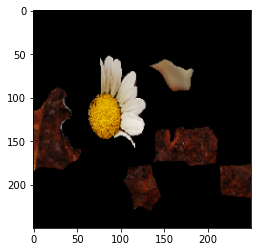

[0.6401608  0.00294335 0.06388777 0.04772725 0.24528089]
Original Class: 0 original confidence:0.977972149848938 new class top:0 new confidence top: 0.6401607990264893 
Explainer name: grad Image number: 6 num_features 10 batch 0 number 5 strategy rest
Hitting cache, returning prev values


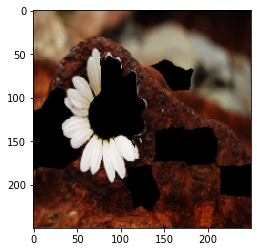

[0.12477396 0.00493333 0.78070813 0.05038182 0.03920282]
Original Class: 0 original confidence:0.977972149848938 new class top:2 new confidence top: 0.12477396428585052 


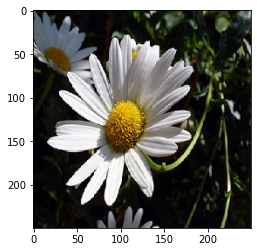

Explainer name: grad Image number: 7 num_features 1 batch 0 number 6 strategy top


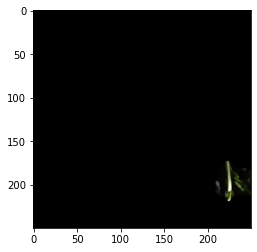

[0.02536097 0.9486048  0.01923392 0.00464823 0.00215208]
Original Class: 0 original confidence:0.9927156567573547 new class top:1 new confidence top: 0.025360967963933945 
Explainer name: grad Image number: 7 num_features 1 batch 0 number 6 strategy rest
Hitting cache, returning prev values


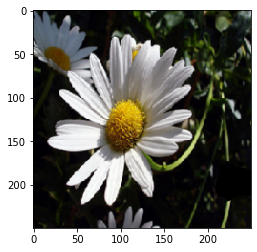

[9.9554861e-01 4.2229641e-04 1.6817821e-03 1.9023538e-03 4.4504536e-04]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.9955486059188843 
Explainer name: grad Image number: 7 num_features 2 batch 0 number 6 strategy top
Hitting cache, returning prev values


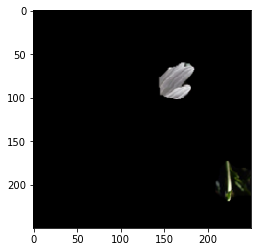

[0.6602065  0.16505261 0.12150926 0.01169665 0.04153505]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.6602064967155457 
Explainer name: grad Image number: 7 num_features 2 batch 0 number 6 strategy rest
Hitting cache, returning prev values


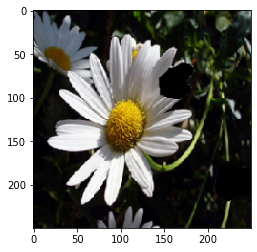

[9.9309468e-01 5.3102023e-04 3.0182141e-03 2.5225480e-03 8.3371130e-04]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.9930946826934814 
Explainer name: grad Image number: 7 num_features 3 batch 0 number 6 strategy top
Hitting cache, returning prev values


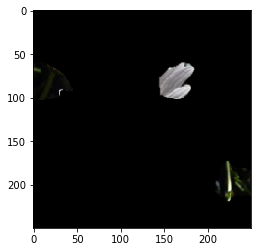

[0.53690976 0.23236349 0.17959473 0.0090217  0.04211024]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.5369097590446472 
Explainer name: grad Image number: 7 num_features 3 batch 0 number 6 strategy rest
Hitting cache, returning prev values


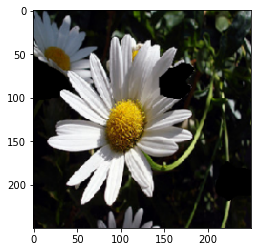

[9.9225593e-01 6.3374499e-04 3.4864689e-03 2.6248957e-03 9.9891867e-04]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.9922559261322021 
Explainer name: grad Image number: 7 num_features 4 batch 0 number 6 strategy top
Hitting cache, returning prev values


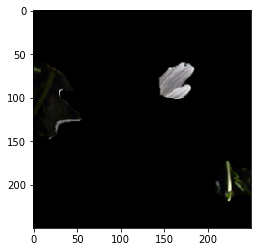

[0.38283515 0.3384321  0.2375636  0.00603239 0.03513682]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.38283514976501465 
Explainer name: grad Image number: 7 num_features 4 batch 0 number 6 strategy rest
Hitting cache, returning prev values


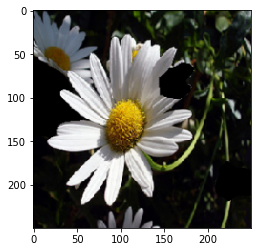

[9.9015325e-01 8.0442702e-04 4.9591749e-03 2.9303823e-03 1.1527793e-03]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.9901532530784607 
Explainer name: grad Image number: 7 num_features 5 batch 0 number 6 strategy top
Hitting cache, returning prev values


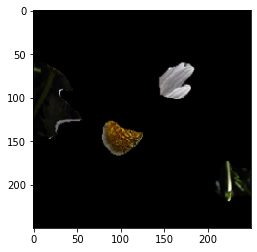

[0.71006167 0.11965097 0.08506986 0.00651068 0.07870684]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.7100616693496704 
Explainer name: grad Image number: 7 num_features 5 batch 0 number 6 strategy rest
Hitting cache, returning prev values


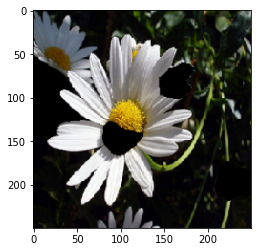

[0.9809847  0.00121559 0.0079845  0.00649842 0.00331669]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.9809846878051758 
Explainer name: grad Image number: 7 num_features 6 batch 0 number 6 strategy top
Hitting cache, returning prev values


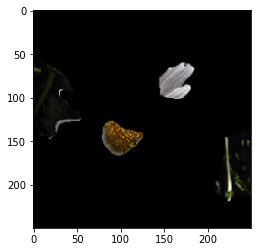

[0.67103434 0.14805701 0.0851587  0.00657678 0.08917324]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.6710343360900879 
Explainer name: grad Image number: 7 num_features 6 batch 0 number 6 strategy rest
Hitting cache, returning prev values


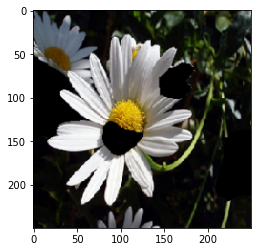

[0.98316896 0.00111748 0.00702583 0.00565177 0.00303593]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.9831689596176147 
Explainer name: grad Image number: 7 num_features 7 batch 0 number 6 strategy top
Hitting cache, returning prev values


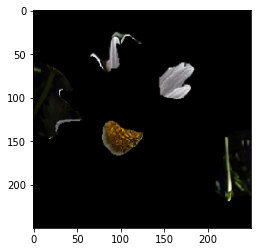

[0.49580282 0.20158379 0.1010358  0.00926396 0.19231366]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.4958028197288513 
Explainer name: grad Image number: 7 num_features 7 batch 0 number 6 strategy rest
Hitting cache, returning prev values


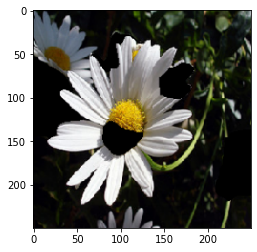

[0.97578406 0.00154257 0.01188157 0.00649555 0.0042963 ]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.9757840633392334 
Explainer name: grad Image number: 7 num_features 8 batch 0 number 6 strategy top
Hitting cache, returning prev values


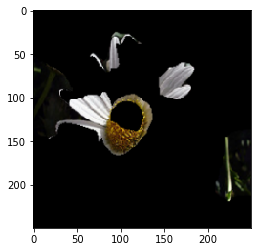

[0.7374688  0.1042078  0.06725475 0.05768197 0.03338666]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.7374687790870667 
Explainer name: grad Image number: 7 num_features 8 batch 0 number 6 strategy rest
Hitting cache, returning prev values


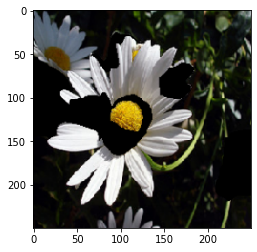

[0.9761351  0.00182837 0.00509988 0.01371608 0.00322067]
Original Class: 0 original confidence:0.9927156567573547 new class top:0 new confidence top: 0.9761350750923157 
Explainer name: grad Image number: 7 num_features 9 batch 0 number 6 strategy top
Hitting cache, returning prev values


KeyboardInterrupt: 

In [41]:
# make a color map
import grad_cam as grad
from matplotlib.colors import LinearSegmentedColormap
import grad_cam as grad
import grad_cam as grad
colors = []
for l in np.linspace(1,0,100):
    colors.append((0,0,0,l))
for l in np.linspace(0,1,100):
    colors.append((0,0,0,l))
cm = LinearSegmentedColormap.from_list("shap", colors)


def init_csv(explainer_name):
    model_name = "flowers"
    newrows_filename =  "{}_{}_rows.csv".format(model_name, explainer_name, model_name)
#     newrows_filename =  "{}-values.csv".format(model_name)
    if os.path.exists(newrows_filename):
        os.remove(newrows_filename)

    with open(newrows_filename, 'a', newline='') as fd:
        writer = csv.writer(fd)
        header = ["original_class", "original_probability", "new_probability",
                  "confidence_diff","class_change", "new_class",
                  "explainer","strategy", "time", "num_features"]
        writer.writerow(header)

def save_row(original_class, original_probability, new_probability, confidence_diff ,class_change, new_class, explainer,strategy, time, num_features):
    model_name = "flowers"
    fileName =  "{}_{}_rows.csv".format(model_name, explainer, model_name)
#     fileName =  "{}-values.csv".format(model_name)
    with open(fileName, 'a', newline='') as fd:
        writer = csv.writer(fd)
        result = [original_class, original_probability, new_probability, confidence_diff,class_change, new_class, explainer,strategy, time, num_features]
        writer.writerow(result)
        
def fill_segmentation(values, segmentation, keep_top):
        out = np.zeros(segmentation.shape)
        for i in range(len(values)):
            if keep_top:
                out[segmentation == i] = 0 if values[i]> 0 else 1
            else:
                out[segmentation == i] = 1 if values[i]> 0 else 0
        return out

    # define a function that depends on a binary mask representing if an image region is hidden
def mask_image(zs, segmentation, image, background=None):
    if background is None:
        background = image.mean((0,1))
    out = np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
    for i in range(zs.shape[0]):
        out[i,:,:,:] = image
        for j in range(zs.shape[1]):
            if zs[i,j] == 0:
                out[i][segmentation == j,:] = background
    return out

prev_shap_values=None
prev_img_orig =None
prev_explanation = None
def calculate_predictions(img_orig, original_class, explainer_name, num_features, strategy):
    # segment the image so we don't have to explain every pixel
    segments_slic = slic(img_orig, n_segments=50, compactness=30, sigma=3)
    
    def f(z):
        return model.predict(mask_image(z, segments_slic, img_orig, 250))
    
    
    global prev_shap_values
    global prev_img_orig
    global prev_explanation
    if ((explainer_name =='shap' or explainer_name =='random' or explainer_name =='grad') & (img_orig == prev_img_orig).all()):
        print ("Hitting cache, returning prev values")
        shap_values = prev_shap_values
    elif explainer_name =='shap':
        # use Kernel SHAP to explain the network's predictions
        explainer = shap.KernelExplainer(f, np.zeros((1,50)))
        shap_values = explainer.shap_values(np.ones((1,50))) #, nsamples=1000) # runs model 1000 times
    elif explainer_name =='grad':
        # use Kernel SHAP to explain the network's predictions
        last_conv_layer_name = "conv2d_14"
        classifier_layer_names = [            "global_average_pooling2d_8",            "dense_30",        ]
        heatmap = grad.make_gradcam_heatmap(img_orig.reshape(1,250, 250, 3), model, last_conv_layer_name, classifier_layer_names)
        shap_values = []
        grad_values = grad.shrink(heatmap, 7, 7)
        for i in range (5):
            shap_values.append([grad_values.tolist()])
        shap_values = np.array(shap_values)
    elif explainer_name =='random':
        shap_values =[numpy.asarray([[random.uniform(0,1)  for iter in range(50)]]) for i in range(5)]
    elif explainer_name == 'lime':
        if ((img_orig == prev_img_orig).all()):
            explanation = prev_explanation
            print ("Hitting LIME cache, returning prev values")
        else :
            explainer = lime_image.LimeImageExplainer()
            explanation = explainer.explain_instance(img_orig.astype("double"), model.predict, num_samples = 1000)
            prev_explanation = explanation
            prev_img_orig =img_orig
            
        top, mt = explanation.get_image_and_mask(explanation.top_labels[original_class] , positive_only=True, negative_only=False, hide_rest=True, num_features = num_features, min_weight=0)
        rest, mr = explanation.get_image_and_mask(explanation.top_labels[original_class], positive_only=False, negative_only=True, num_features=1000, hide_rest=True)

        if strategy == "top":
#             shap_values = []
#             grad_values = grad.shrink(heatmap, 7, 7)
#             for i in range (5):
#                 shap_values.append([grad_values.tolist()])
#             shap_values = np.array(shap_values)
            plt.imshow(top)
            plt.show()
            new_class = model.predict_classes(top.reshape(1,250,250,3))[0]
            new_prediction = model.predict(top.reshape(1,250,250,3))[0][original_class]
        else:
            plt.imshow(rest)
            plt.show()
            plt.imshow(mr)
            plt.show()
            new_class = model.predict_classes(rest.reshape(1,250,250,3))[0]
            new_prediction = model.predict(rest.reshape(1,250,250,3))[0][original_class]
        return new_class, new_prediction
    
    prev_shap_values=shap_values
    prev_img_orig =img_orig
    # get the top predictions from the model
    preds = model.predict(np.expand_dims(img_orig.copy(), axis=0))
    top_preds = np.argsort(-preds)
    
#     show_cut_image(shap_values, img_orig)
    
    shap_values = [np.where(a<0, 0, a) for a in shap_values]
    shap_values = extract_top_ten(shap_values, num_features)
   
    # plot our explanations for top shap superpixels
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5,5))
    inds = top_preds[0]

    max_val = np.max([np.max(np.abs(shap_values[i][:,:-1])) for i in range(len(shap_values))])
    
    if (inds[0] != original_class):
        print("inds[0] not euqal to origianl class")
        
    if strategy == "top":
        m = fill_segmentation(shap_values[inds[0]][0], segments_slic, True)
    else:
        m = fill_segmentation(shap_values[inds[0]][0], segments_slic, False)
        
    #     axes[i+1].set_title(feature_names[str(inds[i])][1])
    plt.imshow(img_orig)
    plt.imshow(m, cmap=cm, vmin=-max_val, vmax=max_val)
    plt.axis('off')
    plt.margins(0,0)
    # cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
    # cb.outline.set_visible(False)
    plt.margins(0,0)
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())
    plt.savefig("foo.png", bbox_inches = 'tight',
        pad_inches = 0)
    plt.close()
    
    img = image.load_img("foo.png", target_size=(250, 250, 3))
    new_img = image.img_to_array(img)
    
    standardized_image = test_gen.standardize(new_img)
#     standardized_image = new_img
    plt.imshow((standardized_image))
    plt.show()
    new_class  = model.predict_classes(standardized_image.reshape(1,250,250,3))[0]
    print( model.predict(standardized_image.reshape(1,250,250,3))[0])
    new_prediction = model.predict(standardized_image.reshape(1,250,250,3))[0][original_class]
    return new_class, new_prediction

def start(explainer_name, num_features_list):
    counter = 0
    for i in range(len(test_image_gen)):
        batch = test_image_gen[i]
        for j in range(len(batch[0])):
            counter = counter + 1
            img = batch[0][j]
            original_class = model.predict_classes(img.reshape(1,250,250,3))[0]
            original_confidence = model.predict(img.reshape(1,250,250,3))[0][original_class]
            if original_class == np.argmax(batch[1][j]):
                plt.imshow((img))
                plt.show()
                plt.close()
                for num_features in num_features_list:
                    for strategy in ["top", "rest"]:
                        print ("Explainer name: {} Image number: {} num_features {} batch {} number {} strategy {}".format(explainer_name, counter, num_features, i, j, strategy))
                        start_time = time.time()
                        new_class, new_prediction = calculate_predictions(img, original_class, explainer_name, num_features, strategy)
                        total_time = time.time() - start_time
                        print ("Original Class: {} original confidence:{} new class top:{} new confidence top: {} "
                               .format(original_class, original_confidence, new_class, new_prediction) )

                        save_row(original_class, original_confidence, new_prediction,original_confidence - new_prediction ,original_class != new_class, new_class, explainer_name, strategy, total_time, num_features)

for explainer_name in ["lime"]:
# for explainer_name in [sys.argv[1]]:
    init_csv(explainer_name)
    start(explainer_name, list(range(1,11)))


In [ ]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(img_orig.astype("double"), model.predict)

In [ ]:
help(lime_image.LimeImageExplainer)

In [ ]:
help(explainer.shap_values)

In [ ]:
from lime.wrappers.scikit_image import SegmentationAlgorithm
segmentation_quick = SegmentationAlgorithm('quickshift', kernel_size=4, max_dist=200, ratio=0.2, random_seed=42)

In [ ]:
img = image.load_img("foo.png", target_size=(250, 250, 3))
img_orig = image.img_to_array(img)
standardized_image = test_gen.standardize(img_orig)
plt.imshow((standardized_image))

In [ ]:
model.predict(standardized_image.reshape(1,250,250,3))